In [4]:
import numpy as np
import scipy
import IPython.display as ipd

import matplotlib.pyplot as plt

In [54]:
# sound tests

# samples per second
SR = 96000

# frequency
f = 110

# seconds
T = 5

x = np.exp(2j * np.pi * np.arange(SR * T) * f / SR)

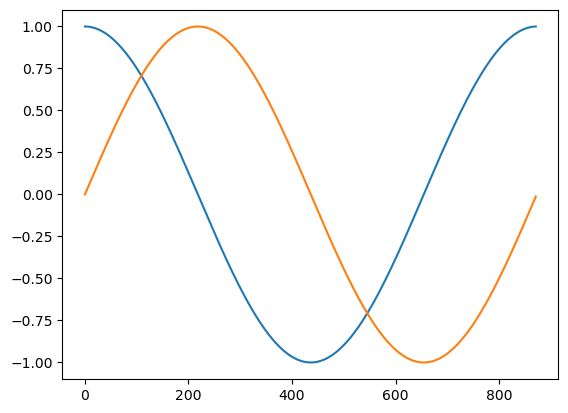

In [55]:
wavelength = x[:SR // f]
plt.plot(np.real(wavelength))
plt.plot(np.imag(wavelength))

In [56]:
ipd.Audio(np.real(x), rate = SR)

In [57]:
N = 4096

DFT = np.zeros((N,N), dtype = 'complex')

for m in range(N):
    DFT[m] = np.exp(2j * np.pi * np.arange(N) * m / N)

In [58]:
ipd.Audio(np.real(np.tile(DFT[13], 50)), rate = SR)

In [72]:
# convolve f by an impulse response
def convolve(f, response):
    output = np.zeros(len(f) + len(response), dtype = 'complex')
    for i, a in enumerate(response):
        output[i:i + len(f)] += a * f
    return output

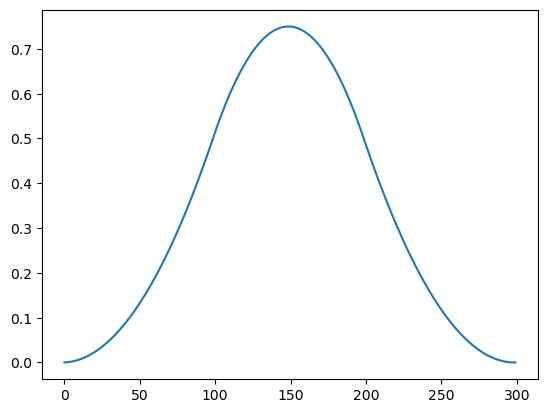

In [60]:
x = convolve(np.ones(100), np.ones(100) / 100)
plt.plot(convolve(x, np.ones(100) / 100))

In [61]:
_, data = scipy.io.wavfile.read('HS3.wav')

In [68]:
x = data[:,0] / np.max(np.abs(data[:,0]))

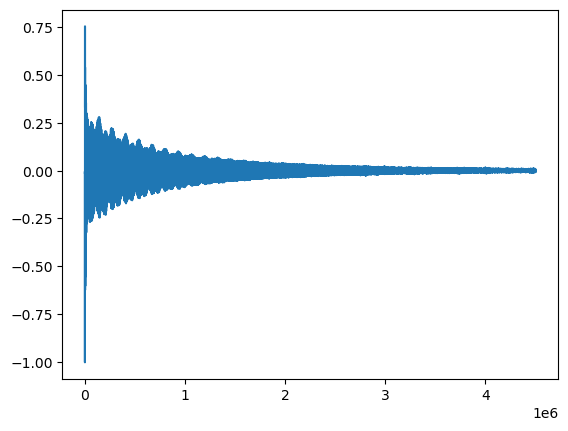

In [70]:
plt.plot(x)

/opt/homebrew/Caskroom/mambaforge/base/envs/m159/lib/python3.13/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/opt/homebrew/Caskroom/mambaforge/base/envs/m159/lib/python3.13/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


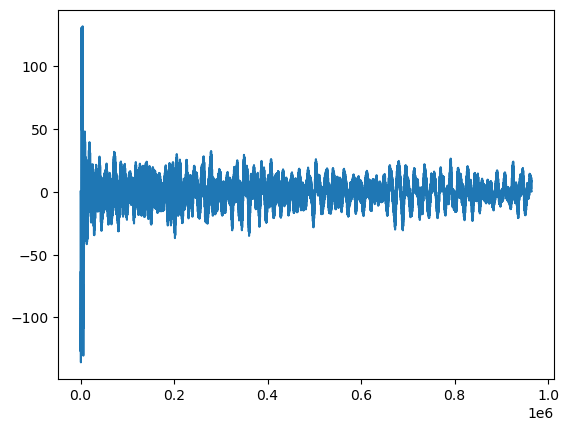

In [77]:
plt.plot(convolve2(x[:10 * SR], DFT[0]))

In [76]:
convolve2 = scipy.signal.convolve

In [80]:
comparisons = [convolve2(x[:1 * SR], d) for d in DFT]

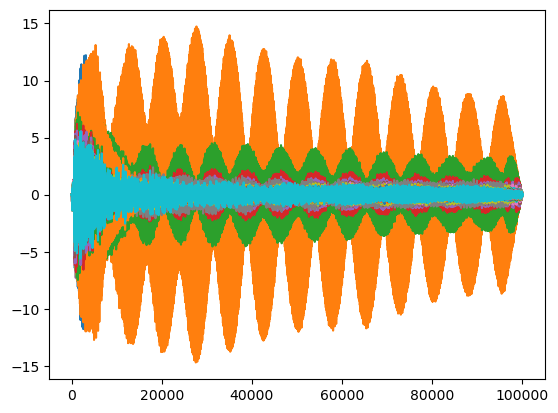

In [94]:
for i in range(100,120):
    plt.plot(comparisons[i])

In [101]:
ipd.Audio(np.real(comparisons[50]),rate = SR)

In [92]:
6 * 4096 / SR

0.256

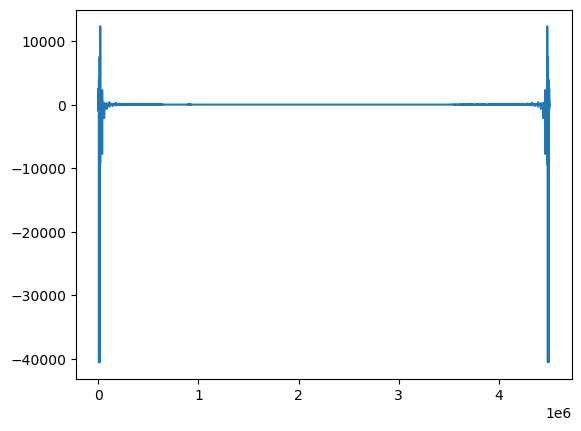

In [103]:
true_fft = scipy.fft.fft(x)
plt.plot(true_fft)

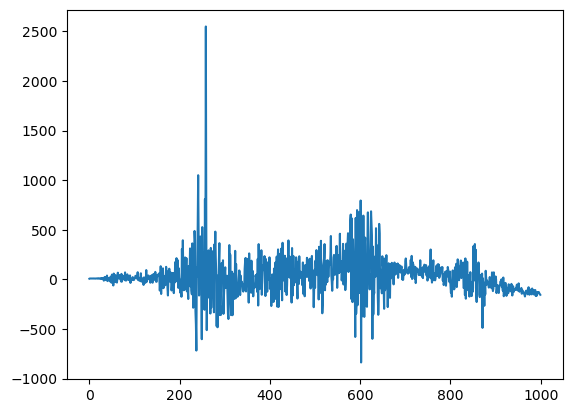

In [108]:

plt.plot(true_fft[:1000])

In [119]:
new_fft = np.zeros_like(true_fft)
energy = np.sqrt(np.mean(np.abs(true_fft) ** 2))
thresh = 10
for i, a in enumerate(true_fft):
    new_fft[i] = 0 if np.abs(a) < thresh * energy else a

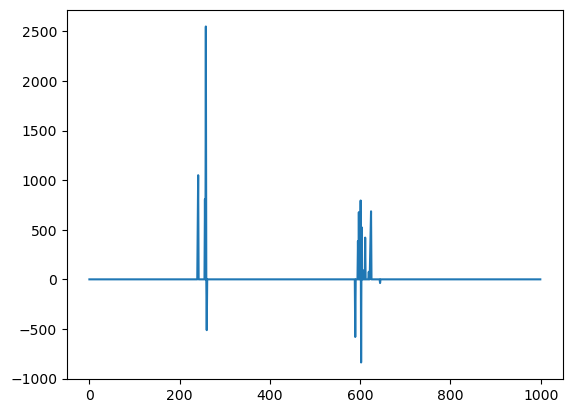

In [120]:
plt.plot(new_fft[:1000])

In [121]:
new_signal = np.real(scipy.fft.ifft(new_fft))

In [122]:
ipd.Audio(new_signal, rate = SR)